# Music Generation with Neural Newtorks

This project goes through generation of musical notes using neural networks. It is based on a collection of piano MIDI files from the [MAESTRO dataset](https://magenta.tensorflow.org/datasets/maestro). Different approaches are used, such as AutoEncoders, Recursive Neural Networks and Generative Adversarial Networks. 
The aim is to understand differences, produce code to test the topologies and evaluate a summary in the end.

# Setup and Introduction to MIDI

## Install Python Packages

We will use the [`pretty_midi`](https://github.com/craffel/pretty-midi) library to create and parse MIDI files, and we will generate audio playback in Jupter Notebook Audio.

In [1]:
%pip install tensorflow wheel numpy pandas matplotlib seaborn pretty-midi ipython scipy scikit-learn midi_neural_processor keras_hub


[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
import collections
import datetime
import scipy
import tempfile
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf
import keras
import os
import urllib
from zipfile import ZipFile
import midi_neural_processor.processor as midi_tokenizer 
import pathlib 
import random
from keras_hub import layers as hub_layers
import scipy.io.wavfile as wavfile
from IPython.display import Audio

from IPython import display
from matplotlib import pyplot as plt
from typing import Optional

print(tf.config.list_physical_devices('GPU'))

2025-06-25 11:27:54.663989: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-25 11:27:54.668634: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-06-25 11:27:54.774587: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-06-25 11:27:54.822662: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750843674.917253   11295 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750843674.93

[]


2025-06-25 11:27:58.793503: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [3]:
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

# Sampling rate for audio playback
_SAMPLING_RATE = 16000

## Download the Maestro dataset

In [4]:
data_dir = "maestro-v3.0.0"
if not os.path.exists(data_dir):
    url = 'https://storage.googleapis.com/magentadata/datasets/maestro/v3.0.0/maestro-v3.0.0-midi.zip'
    file_name = 'maestro-v3.0.0-midi.zip'
    
    urllib.request.urlretrieve(url, file_name)
    
    with ZipFile(file_name, 'r') as zip_file:
        zip_file.extractall()
    
    print("Files downloaded successfully")
    os.remove(file_name)
else:
    print("Dataset found")

Dataset found


The dataset contains about 1,200 MIDI files.

In [5]:
filenames = glob.glob(str(data_dir+ "/**/*.mid*"))
print('Number of files:', len(filenames))

Number of files: 1276


## Process a MIDI file

First, use ```pretty_midi``` to parse a single MIDI file and inspect the format of the notes.


In [6]:
sample_file = filenames[1]
print(sample_file)

maestro-v3.0.0/2004/MIDI-Unprocessed_XP_09_R1_2004_05_ORIG_MID--AUDIO_09_R1_2004_06_Track06_wav.midi


Generate a `PrettyMIDI` object for the sample MIDI file.

In [7]:
pm = pretty_midi.PrettyMIDI(sample_file)

Play the sample file. The playback widget may take several seconds to load. We will use `display_audio` function in the rest of the experience! You can also specify a `save_path` argument to save the wav file locally.

In [8]:
def display_audio(pm: pretty_midi.PrettyMIDI, seconds=120, save_path=None):
    """
    Generate audio and save to file instead of playing directly
    """
    # Basic synthesis (you can improve this)
    waveform = synthesize_midi_basic(pm, _SAMPLING_RATE)
    
    # Take a sample of the generated waveform
    waveform_short = waveform[:seconds*_SAMPLING_RATE]
    
    # Normalize and convert to int16
    waveform_normalized = np.clip(waveform_short, -1, 1)

    # Save to file
    if save_path is not None:
        audio_data = (waveform_normalized * 32767).astype(np.int16)
        save_path = f"output_audio_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}.wav"
        wavfile.write(save_path, _SAMPLING_RATE, audio_data)
        print(f"Audio saved to: {save_path}")
    
    return Audio(waveform_normalized, rate=_SAMPLING_RATE)


def synthesize_midi_basic(pm: pretty_midi.PrettyMIDI, fs: int):
    """
    Basic MIDI synthesis without external dependencies
    """
    total_samples = int((pm.get_end_time() + 1) * fs)
    waveform = np.zeros(total_samples)
    
    for instrument in pm.instruments:
        if instrument.is_drum:
            continue
            
        for note in instrument.notes:
            start_sample = int(note.start * fs)
            end_sample = int(note.end * fs)
            duration = end_sample - start_sample
            
            if duration > 0 and end_sample <= len(waveform):
                # Generate sine wave
                frequency = pretty_midi.note_number_to_hz(note.pitch)
                t = np.linspace(0, note.end - note.start, duration)
                note_wave = 0.3 * np.sin(2 * np.pi * frequency * t)
                
                # Simple envelope
                fade_samples = min(int(0.01 * fs), duration // 4)
                envelope = np.ones_like(note_wave)
                if fade_samples > 0:
                    envelope[:fade_samples] = np.linspace(0, 1, fade_samples)
                    envelope[-fade_samples:] = np.linspace(1, 0, fade_samples)
                note_wave *= envelope
                
                waveform[start_sample:end_sample] += note_wave
    
    return waveform

Note: the sound of the Jupyter Audio are digital. This is to avoid the need to install `fluidsynth` on your system to reproduce MIDI instruments. For results, see the `results/` folder where you can find `.wav` files that I created from the MIDI files generated by the networks and played with a Piano using `fluidsynth`.

In [9]:
display_audio(pm)

MIDI containts data for the track:

In [10]:
print('Number of instruments:', len(pm.instruments))
instrument = pm.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Instrument name:', instrument_name)

Number of instruments: 1
Instrument name: Acoustic Grand Piano


## Extract notes

In [11]:
for i, note in enumerate(instrument.notes[:10]):
  note_name = pretty_midi.note_number_to_name(note.pitch)
  duration = note.end - note.start
  print(f'{i}: pitch={note.pitch}, note_name={note_name},'
        f' duration={duration:.4f}')

0: pitch=79, note_name=G5, duration=0.1760
1: pitch=78, note_name=F#5, duration=0.1583
2: pitch=74, note_name=D5, duration=0.1115
3: pitch=71, note_name=B4, duration=0.0479
4: pitch=62, note_name=D4, duration=0.1802
5: pitch=59, note_name=B3, duration=0.3250
6: pitch=66, note_name=F#4, duration=0.9125
7: pitch=47, note_name=B2, duration=0.4125
8: pitch=55, note_name=G3, duration=0.1344
9: pitch=59, note_name=B3, duration=0.1448


In [12]:
def midi_to_notes(midi_file: str) -> pd.DataFrame:
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

raw_notes = midi_to_notes(sample_file)
raw_notes.head()

,pitch,start,end,step,duration
0,79,1.034375,1.210417,0.000000,0.176042
1,78,1.148958,1.307292,0.114583,0.158333
2,74,1.265625,1.377083,0.116667,0.111458
3,71,1.375000,1.422917,0.109375,0.047917
4,66,1.511458,2.423958,0.136458,0.912500


We can use the function below to convert from the numeric pitch values to note names. The note name shows the type of note, accidental and octave number
(e.g. C#4). 

In [13]:
get_note_names = np.vectorize(pretty_midi.note_number_to_name)
sample_note_names = get_note_names(raw_notes['pitch'])
sample_note_names[:10]

array(['G5', 'F#5', 'D5', 'B4', 'F#4', 'D4', 'B3', 'B2', 'B4', 'G3'],
      dtype='<U3')

To visualize the musical piece, we plot the note pitch, start and end across the length of the track (i.e. piano roll). Start with the first 100 notes

In [14]:
def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
  if count:
    title = f'First {count} notes'
  else:
    title = f'Whole track'
    count = len(notes['pitch'])
  plt.figure(figsize=(20, 4))
  plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
  plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
  plt.plot(
      plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
  plt.xlabel('Time [s]')
  plt.ylabel('Pitch')
  _ = plt.title(title)

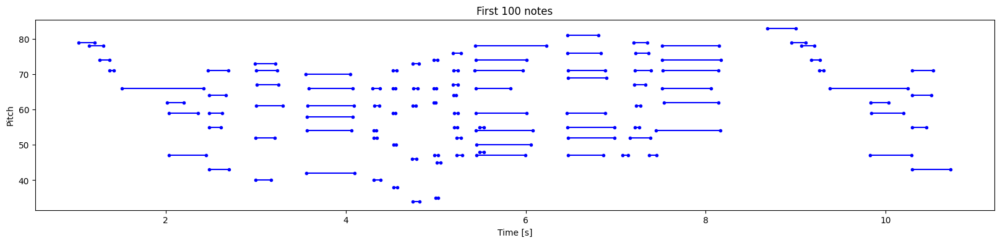

In [15]:
plot_piano_roll(raw_notes, count=100)

Plot the notes for the entire track.

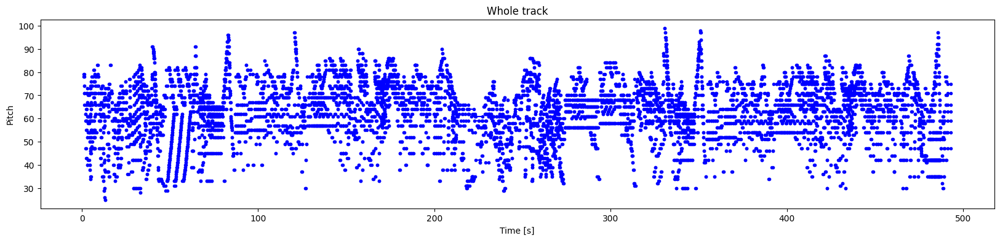

In [16]:
plot_piano_roll(raw_notes)

Check the distribution of each note variable.

In [17]:
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
  plt.figure(figsize=[15, 5])
  plt.subplot(1, 3, 1)
  sns.histplot(notes, x="pitch", bins=20)

  plt.subplot(1, 3, 2)
  max_step = np.percentile(notes['step'], 100 - drop_percentile)
  sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))
  
  plt.subplot(1, 3, 3)
  max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
  sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))

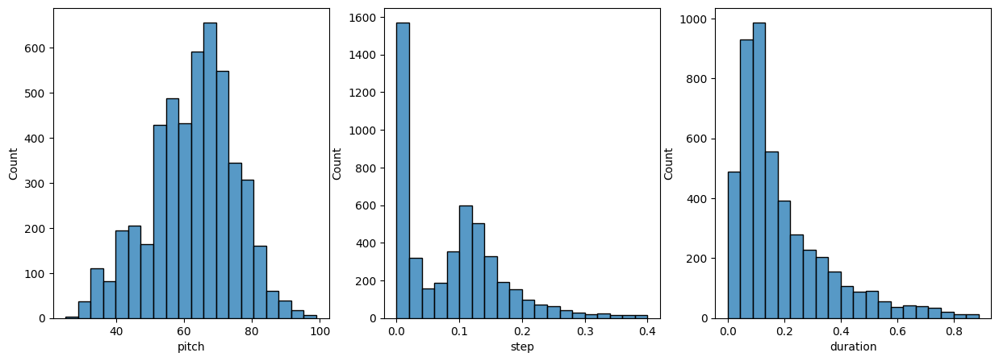

In [18]:
plot_distributions(raw_notes)

## Create a MIDI file

You can generate your own MIDI file from a list of notes using the function below.

In [19]:
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str = "", 
  instrument_name: str = "",
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  if out_file != "":
    pm.write(out_file)
  return pm

In [20]:
example_file = 'example.midi'
example_pm = notes_to_midi(
    raw_notes, instrument_name=instrument_name)

By playing the generated MIDI file we can see there is no difference.

In [21]:
display_audio(example_pm)

# Music Generation with RNNs

## Create the training dataset


We will use three variables to represent a note when training the model: `pitch`, `step` and `duration`. The pitch is the perceptual quality of the sound as a MIDI note number. 
The `step` is the time elapsed from the previous note or start of the track.
The `duration` is how long the note will be playing in seconds and is the difference between the note end and note start times. 

In [ ]:
raw_notes = midi_to_notes(sample_file)
raw_notes.head()

Let's create the training dataset by extracting notes from the MIDI files. In this experiment, we use only `num_files` songs, but use more for better results!

In [ ]:
num_files = 50
all_notes = []
for f in filenames[:num_files]:
  notes = midi_to_notes(f)
  all_notes.append(notes)

all_notes = pd.concat(all_notes)

In [ ]:
n_notes = len(all_notes)
print('Number of notes parsed:', n_notes)

Next, we create a `tf.data.Dataset` from the parsed notes.

In [ ]:
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)
train_notes

In [ ]:
notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

We will train the model on batches of sequences of notes. Each example will consist of a sequence of notes as the input features, and the next note as the label. In this way, the model will be trained to predict the next note in a sequence.

In [ ]:
def create_sequences(
    dataset: tf.data.Dataset, 
    seq_length: int,
    vocab_size = 128, # midi
) -> tf.data.Dataset:
  """Returns TF Dataset of sequence and label examples."""
  seq_length = seq_length+1

  # Take 1 extra for the labels
  windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)

  # `flat_map` flattens the" dataset of datasets" into a dataset of tensors
  flatten = lambda x: x.batch(seq_length, drop_remainder=True)
  sequences = windows.flat_map(flatten)
  
  # Normalize note pitch
  def scale_pitch(x):
    x = x/[vocab_size,1.0,1.0]
    return x

  # Split the labels
  def split_labels(sequences):
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)

Set the sequence length for each example. We experiment with different length `seq_length` and check if it works best for the data. The size of the vocabulary (`vocab_size`) is set to 128 representing all the pitches supported by `pretty_midi`.

In [ ]:
seq_length = 25
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

The shape of the dataset is ```(seq_length,3)```, meaning that the model will take `seq_length` notes as input, and learn to predict the following note as output.

In [ ]:
for seq, target in seq_ds.take(1):
  print('sequence shape:', seq.shape)
  print('sequence elements (first 10):', seq[0: 10])
  print()
  print('target:', target)

Batch the examples, and configure the dataset for performance.

In [ ]:
batch_size = 64
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [ ]:
train_ds.element_spec

## Create and train the model

The model will have three outputs, one for each note variable. For `step` and `duration`, we use a custom loss function based on mean squared error that encourages the model to output non-negative values.

In [ ]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
  return tf.reduce_mean(mse + positive_pressure)

Defining LSTM layers with Keras is extremely simple.

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.005

inputs = keras.Input(input_shape)
x = keras.layers.LSTM(128)(inputs)

outputs = {
  'pitch': keras.layers.Dense(128, name='pitch')(x),
  'step': keras.layers.Dense(1, name='step')(x),
  'duration': keras.layers.Dense(1, name='duration')(x),
}

model = keras.Model(inputs, outputs)

loss = {
      'pitch': keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

model.compile(loss=loss, optimizer=optimizer) # type: ignore

model.summary()

Testing the `model.evaluate` function, you can see that the `pitch` loss is significantly greater than the `step` and `duration` losses. 
Note that `loss` is the total loss computed by summing all the other losses and is currently dominated by the `pitch` loss.

In [ ]:
losses = model.evaluate(train_ds, return_dict=True)
losses

One way balance this is to use the `loss_weights` argument to compile:

In [ ]:
model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)

The `loss` then becomes the weighted sum of the individual losses.

In [ ]:
model.evaluate(train_ds, return_dict=True)

Train the model. We prevent eccessive learning by EarlyStopping callback with patience 5.

In [ ]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath='./training_checkpoints/ckpt_{epoch}.weights.h5',
        save_weights_only=True),
    keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=5,
        verbose=1,
        restore_best_weights=True),
]

In [ ]:
%%time
epochs = 100

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

In [ ]:
plt.plot(history.epoch, history.history['loss'], label='total loss')
plt.show()

## Generate notes

To use the model to generate notes, we first need to provide a starting sequence of notes. The function below generates one note from a sequence of notes. 

For note pitch, it draws a sample from the softmax distribution of notes produced by the model, and does not simply pick the note with the highest probability.
Always picking the note with the highest probability would lead to repetitive sequences of notes being generated.

The `temperature` parameter can be used to control the randomness of notes generated.

In [ ]:
def predict_next_note(
    notes: np.ndarray, 
    model: keras.Model, 
    temperature: float = 1.0) -> tuple[int, float, float]:
  """Generates a note as a tuple of (pitch, step, duration), using a trained sequence model."""

  assert temperature > 0

  # Add batch dimension
  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs)
  pitch_logits = predictions['pitch']
  step = predictions['step']
  duration = predictions['duration']
 
  pitch_logits /= temperature
  pitch = tf.random.categorical(pitch_logits, num_samples=1)
  pitch = tf.squeeze(pitch, axis=-1)
  duration = tf.squeeze(duration, axis=-1)
  step = tf.squeeze(step, axis=-1)

  # `step` and `duration` values should be non-negative
  step = tf.maximum(0, step)
  duration = tf.maximum(0, duration)

  return int(pitch), float(step), float(duration)

Now generate some notes. You can play around with temperature and the starting sequence in `next_notes` and see what happens.

In [ ]:
temperature = 6
num_predictions = 120

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
  pitch, step, duration = predict_next_note(input_notes, model, temperature)
  start = prev_start + step
  end = start + duration
  input_note = (pitch, step, duration)
  generated_notes.append((*input_note, start, end))
  input_notes = np.delete(input_notes, 0, axis=0)
  input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
  prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

In [ ]:
generated_notes.head(10)

In [ ]:
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

Visualize the generated notes.

In [ ]:
plot_piano_roll(generated_notes)

Check the distributions of `pitch`, `step` and `duration`.

In [ ]:
plot_distributions(generated_notes)

In the above plots, you can notice the change in distribution of the note variables.
Since there is a feedback loop between the model's outputs and inputs, the model tends to generate similar sequences of outputs to reduce the loss. 
This is particularly relevant for `step` and `duration`, which uses the MSE loss.
For `pitch`, you can increase the randomness by increasing the `temperature` in `predict_next_note`.


## Output Analysis

Interesting results! But there are little issues. Any listener could easly feel that the harmony is poor. And, did you notice that the output is monophonic? We are training on a poliphonic dataset, so why isn't this reflected on the output?

The RNN module is able to generate only one **one at a time**. This makes generation of chords complicated for the model. Other parameters which could be tuned could be: 
1. Input notes sequence lenght.
2. Represent Chords in the inputs with a advanced representation.
3. Increase dimension of the LSTM layer.
4. Train for more epochs.
5. Use a larger subset of the dataset.
6. Normalize step, duration and pitch for training instead of using `loss_weights`.

# Music Generation with Auto-Encoders

Getting results for Music Generation with AEs is pretty much straight forward. Much of the work is done by finding a suitable training set format for the encoder since it's pretty much the core of this kind of model. We will encode music in a latent space and then sample new music generation from this space. 


Present the worst at the beginning and best results in the end

## Create the training dataset

We're using **Piano Roll** representation: this tecnology comes from old piano music represented in paper by creating "holes" corresponding to the note to be played by the piano on the y-axes, while the x-axis represents time. It's a simple bi-dimensional representation tipically used also for VAEs in Music.

In [ ]:
# Parameters
FRAME_LENGTH = 0.05  # 50ms per frame
SEGMENT_DURATION = 10.0  # seconds
N_FRAMES = int(SEGMENT_DURATION / FRAME_LENGTH)

def notes_to_piano_roll(notes, frame_length=FRAME_LENGTH, segment_duration=SEGMENT_DURATION):
    max_time = max(notes['end'].max(), segment_duration)
    segments = []
    for seg_start in np.arange(0, max_time, segment_duration):
        seg_end = seg_start + segment_duration
        roll = np.zeros((N_FRAMES, 128)) # 128 possible notes played (pitch)
        
        # Filter notes in current segment
        seg_notes = notes[(notes['start'] < seg_end) & (notes['end'] > seg_start)]
        
        for _, note in seg_notes.iterrows():
            pitch = int(note['pitch'])
            start_in_seg = max(0, note['start'] - seg_start)
            end_in_seg = min(segment_duration, note['end'] - seg_start)
            
            # Convert to frame indices
            start_frame = int(start_in_seg / frame_length)
            end_frame = int(np.ceil(end_in_seg / frame_length))
            
            if start_frame < N_FRAMES:
                end_frame = min(end_frame, N_FRAMES)
                roll[start_frame:end_frame, pitch] = 1  # Mark active note (create a hole)
        segments.append(roll)
    return segments

def piano_roll_to_midi(piano_roll, frame_length=FRAME_LENGTH, threshold=0.1):
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(program=0)  # Piano
    
    # Use lower threshold and check for any activations
    piano_roll_binary = (piano_roll > threshold).astype(float)
    
    note_count = 0
    for pitch in range(128):
        # Find note onsets and offsets
        pitch_activations = piano_roll_binary[:, pitch]
        
        if pitch_activations.sum() == 0:
            continue
            
        # Find note boundaries
        diff = np.diff(pitch_activations, prepend=0, append=0)
        starts = np.where(diff == 1)[0]
        ends = np.where(diff == -1)[0]
        
        for start_frame, end_frame in zip(starts, ends):
            start_time = start_frame * frame_length
            end_time = end_frame * frame_length
            
            # Skip very short notes (less than one frame)
            if end_time - start_time < frame_length:
                continue
                
            note = pretty_midi.Note(
                velocity=100,
                pitch=pitch,
                start=start_time,
                end=end_time
            )
            instrument.notes.append(note)
            note_count += 1
    
    print(f"Created {note_count} notes")
    pm.instruments.append(instrument)
    return pm

In [30]:
# Process MIDI files
num_files = 50
all_segments = []
for filename in filenames[:num_files]:
    notes = midi_to_notes(filename)
    segments = notes_to_piano_roll(notes)
    all_segments.extend(segments)

# Convert to numpy array (num_samples, 80, 128, 1)
data = np.array(all_segments)[..., np.newaxis]
print(f"Dataset shape: {data.shape}")

Dataset shape: (3036, 200, 128, 1)


## Create and train the model

We take as input (`N_FRAMES`, 128 ,1). The encoder is compose by two `Conv2D` layers, then it's flattened and another `Dense` layer is present before the latent space representation. The decoder topology is mirrored. We use skip connections to stabilize training and improve learning.

`Conv2D` is a good idea since piano roll is a 2D representation of music. 

In [32]:
# Input shape
encoder_inputs = keras.layers.Input(shape=(N_FRAMES, 128, 1))

# --- ENCODER with skip connections ---
x1 = keras.layers.Conv2D(32, (3, 3), activation="relu", strides=2, padding="same")(encoder_inputs)  # skip 1
x2 = keras.layers.Conv2D(64, (3, 3), activation="relu", strides=2, padding="same")(x1)              # skip 2

conv_shape = tf.keras.backend.int_shape(x2)[1:]

x = keras.layers.Flatten()(x2)
# x = keras.layers.Dense(16, activation="relu")(x)
latent_dim = 512
encoded = keras.layers.Dense(latent_dim, activation="linear", name="latent_space")(x)

ae_encoder = keras.Model(encoder_inputs, encoded, name="encoder")

# --- FULL DECODER (with skip connections) ---
decoder_input = keras.layers.Input(shape=(latent_dim,))
skip2_input = keras.layers.Input(shape=conv_shape)
skip1_input = keras.layers.Input(shape=(N_FRAMES//2, 128//2, 32))

x = keras.layers.Dense(conv_shape[0]*conv_shape[1]*conv_shape[2], activation="relu")(decoder_input)
x = keras.layers.Reshape(conv_shape)(x)

x = keras.layers.Concatenate()([x, skip2_input])
x = keras.layers.Conv2DTranspose(64, (3, 3), activation="relu", strides=2, padding="same")(x)

x = keras.layers.Concatenate()([x, skip1_input])
x = keras.layers.Conv2DTranspose(32, (3, 3), activation="relu", strides=2, padding="same")(x)

decoder_output = keras.layers.Conv2DTranspose(1, (3, 3), activation="sigmoid", padding="same")(x)
ae_decoder = keras.Model([decoder_input, skip2_input, skip1_input], decoder_output, name="decoder")

# --- AUTOENCODER MODEL ---
encoded_output = ae_encoder(encoder_inputs)
decoder_output_full = ae_decoder([encoded_output, x2, x1])
autoencoder = keras.Model(encoder_inputs, decoder_output_full, name="autoencoder")

autoencoder.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
autoencoder.summary()

# GENERATION DECODER — No skip connections
gen_decoder_input = keras.layers.Input(shape=(latent_dim,))
x = keras.layers.Dense(conv_shape[0]*conv_shape[1]*conv_shape[2], activation="relu")(gen_decoder_input)
x = keras.layers.Reshape(conv_shape)(x)
x = keras.layers.Conv2DTranspose(64, (3, 3), activation="relu", strides=2, padding="same")(x)
x = keras.layers.Conv2DTranspose(32, (3, 3), activation="relu", strides=2, padding="same")(x)
gen_decoder_output = keras.layers.Conv2DTranspose(1, (3, 3), activation="sigmoid", padding="same")(x)

ae_generation_decoder = keras.Model(gen_decoder_input, gen_decoder_output, name="generation_decoder")

Model: "autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 200, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 100, 64,   │        320 │ input_layer_10[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder             │ (None, 512)       │ 52,448,128 │ input_layer_10[0… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 50, 32,    │     18,496 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ decoder             │ (None, 200, 128,  │ 52,632,961 │ encoder[0][0],    │
│ (Functional)        │ 1)                │            │ conv2d_5[0][0],   │
│                     │                   │            │ conv2d_4[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 105,081,089 (400.85 MB)

 Trainable params: 105,081,089 (400.85 MB)

 Non-trainable params: 0 (0.00 B)

Training is unchanged.

In [33]:
# Split data
from sklearn.model_selection import train_test_split
X_train, X_val = train_test_split(data, test_size=0.2, random_state=42)

# Training (unchanged)
callback = keras.callbacks.EarlyStopping(
    monitor='loss', 
    patience=5,
    restore_best_weights=True,
)

history = autoencoder.fit(
    X_train, X_train,
    validation_data=(X_val, X_val),
    epochs=10,
    batch_size=32,
    callbacks=[callback]
)

Epoch 1/10
47/49 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.9436 - loss: 0.3930

2025-06-24 11:30:29.794202: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-24 11:30:29.935298: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-24 11:30:30.310732: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-06-24 11:30:30.530000: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


49/49 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - accuracy: 0.9453 - loss: 0.3816 - val_accuracy: 0.9806 - val_loss: 0.0729
Epoch 2/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9809 - loss: 0.0635 - val_accuracy: 0.9918 - val_loss: 0.0226
Epoch 3/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9946 - loss: 0.0152 - val_accuracy: 0.9976 - val_loss: 0.0068
Epoch 4/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.9989 - val_loss: 0.0046
Epoch 5/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.9989 - loss: 0.0044 - val_accuracy: 0.9992 - val_loss: 0.0033
Epoch 6/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9993 - loss: 0.0031 - val_accuracy: 0.9994 - val_loss: 0.0025
Epoch 7/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9994 - loss: 0.0021 - val_accuracy: 0.9995 - val_loss: 0.0016
Epoch 8/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9996 - loss: 0.0015 - val_accuracy: 0.9997 - val_loss: 

Let's try also to implement a variational auto encoder: traditional autoencoders consist of an encoder network that maps the input data x to a fixed, lower-dimensional latent space. Traditional autoencoders' latent space is a compressed representation of the input data without any probabilistic modeling, which limits their ability to generate new, diverse data since they lack a mechanism to handle uncertainty.

A VAE encodes each input into a distribution rather than a single point, adding a layer of variability and uncertainty.

In [34]:
# Define sampling layer for reparameterization trick
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

# Custom layer to compute and add KL divergence loss
class KLDivergenceLayer(keras.layers.Layer):
    def __init__(self, beta=1.0, **kwargs):
        super().__init__(**kwargs)
        self.beta = beta
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
        kl_loss = tf.reduce_sum(kl_loss, axis=-1)
        kl_loss *= -0.5 * self.beta
        kl_loss = tf.reduce_mean(kl_loss)
        self.add_loss(kl_loss)
        return inputs  # Pass through the inputs unchanged

# Encoder - Outputs z_mean, z_log_var, z, and skip connections
encoder_inputs = keras.layers.Input(shape=(N_FRAMES, 128, 1))

x1 = keras.layers.Conv2D(32, (3, 3), activation="relu", strides=2, padding="same")(encoder_inputs)  # skip 1
x2 = keras.layers.Conv2D(64, (3, 3), activation="relu", strides=2, padding="same")(x1)              # skip 2

conv_shape = tf.keras.backend.int_shape(x2)[1:]

x = keras.layers.Flatten()(x2)
# x = keras.layers.Dense(16, activation="relu")(x)

latent_dim = 512
z_mean = keras.layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = keras.layers.Dense(latent_dim, name="z_log_var")(x)

# KL divergence layer
z_mean, z_log_var = KLDivergenceLayer(beta=1.0)([z_mean, z_log_var])
z = Sampling()([z_mean, z_log_var])

# Full encoder outputs z_mean, z_log_var, z, skip1, skip2
vae_encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z, x1, x2], name="encoder")

# VAE Decoder with skip connections
decoder_input = keras.layers.Input(shape=(latent_dim,))
skip2_input = keras.layers.Input(shape=conv_shape)
skip1_input = keras.layers.Input(shape=(N_FRAMES//2, 128//2, 32))  # x1 shape

x = keras.layers.Dense(conv_shape[0] * conv_shape[1] * conv_shape[2], activation="relu")(decoder_input)
x = keras.layers.Reshape(conv_shape)(x)

x = keras.layers.Concatenate()([x, skip2_input])
x = keras.layers.Conv2DTranspose(64, (3, 3), activation="relu", strides=2, padding="same")(x)

x = keras.layers.Concatenate()([x, skip1_input])
x = keras.layers.Conv2DTranspose(32, (3, 3), activation="relu", strides=2, padding="same")(x)

decoder_outputs = keras.layers.Conv2DTranspose(1, (3, 3), activation="sigmoid", padding="same")(x)
vae_decoder = keras.Model([decoder_input, skip2_input, skip1_input], decoder_outputs, name="vae_decoder")

# Generation Decoder (no skips, for sampling)
gen_decoder_input = keras.layers.Input(shape=(latent_dim,))
x = keras.layers.Dense(conv_shape[0]*conv_shape[1]*conv_shape[2], activation="relu")(gen_decoder_input)
x = keras.layers.Reshape(conv_shape)(x)
x = keras.layers.Conv2DTranspose(64, (3, 3), activation="relu", strides=2, padding="same")(x)
x = keras.layers.Conv2DTranspose(32, (3, 3), activation="relu", strides=2, padding="same")(x)
gen_decoder_output = keras.layers.Conv2DTranspose(1, (3, 3), activation="sigmoid", padding="same")(x)

vae_generation_decoder = keras.Model(gen_decoder_input, gen_decoder_output, name="generation_decoder")

# Full VAE model using encoder and decoder with skips
z_mean, z_log_var, z, skip1, skip2 = vae_encoder(encoder_inputs)
vae_outputs = vae_decoder([z, skip2, skip1])  # note: order of skips
vae = keras.Model(encoder_inputs, vae_outputs, name="vae")

vae.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
vae.summary()

Model: "vae"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15      │ (None, 200, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder             │ [(None, 512),     │ 104,877,4… │ input_layer_15[0… │
│ (Functional)        │ (None, 512),      │            │                   │
│                     │ (None, 512),      │            │                   │
│                     │ (None, 100, 64,   │            │                   │
│                     │ 32), (None, 50,   │            │                   │
│                     │ 32, 64)]          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_decoder         │ (None, 200, 128,  │ 52,632,961 │ encoder[0][2],    │
│ (Functional)        │ 1)                │            │ encoder[0][4],    │
│                     │                   │            │ encoder[0][3]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 157,510,401 (600.85 MB)

 Trainable params: 157,510,401 (600.85 MB)

 Non-trainable params: 0 (0.00 B)

In [35]:
# Split data
from sklearn.model_selection import train_test_split
X_train, X_val = train_test_split(data, test_size=0.2, random_state=42)

callback = keras.callbacks.EarlyStopping(
    monitor='loss', 
    patience=5,
    restore_best_weights=True,
    )

# Train
history = vae.fit(
    X_train, X_train,
    validation_data=(X_val, X_val),
    epochs=10,
    batch_size=32,
    callbacks=[callback]
)

Epoch 1/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - accuracy: 0.8837 - loss: 1.6442 - val_accuracy: 0.9806 - val_loss: 0.1072
Epoch 2/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy: 0.9805 - loss: 0.1005 - val_accuracy: 0.9811 - val_loss: 0.0746
Epoch 3/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.9815 - loss: 0.0684 - val_accuracy: 0.9843 - val_loss: 0.0476
Epoch 4/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy: 0.9857 - loss: 0.0423 - val_accuracy: 0.9902 - val_loss: 0.0266
Epoch 5/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.9919 - loss: 0.0236 - val_accuracy: 0.9956 - val_loss: 0.0145
Epoch 6/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.9962 - loss: 0.0131 - val_accuracy: 0.9977 - val_loss: 0.0089
Epoch 7/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.9979 - loss: 0.0084 - val_accuracy: 0.9986 - val_loss: 0.0064
Epoch 8/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy: 0.9987 - loss: 0.0062 - val_accuracy: 0.9989 -

## Generate notes

First we define functions to sample from the latent space

In [ ]:
# Random sampling from the latent space
# Sample from a normal distribution (this assumes latent space follows roughly normal distribution)
def random_sampling(decoder, num_samples=9, latent_dim=128):
    samples = []
    
    for i in range(num_samples):
        # Sample from normal distribution
        z_sample = np.random.normal(0, 1, (1, latent_dim))
        generated = decoder.predict(z_sample, verbose=0)[0]
        midi = piano_roll_to_midi(generated.squeeze())
        samples.append(midi)
    
    return samples

def interpolation_sampling(encoder, generation_decoder, real_data_1, real_data_2, num_steps=9):
    """
    Interpolate between two latent vectors using the generation decoder.
    encoder: Model that outputs latent vector (AE) or [z_mean, z_log_var, z, ...] (VAE)
    generation_decoder: Decoder that takes ONLY latent vector (no skip connections)
    """
    # Get encoder outputs
    enc_out_1 = encoder.predict(real_data_1.reshape(1, *real_data_1.shape), verbose=0)
    enc_out_2 = encoder.predict(real_data_2.reshape(1, *real_data_2.shape), verbose=0)
    
    # Extract latent vector (z) from different encoder types
    def extract_latent(enc_out):
        if isinstance(enc_out, list):
            # VAE: [z_mean, z_log_var, z, skip1, skip2]
            return enc_out[2] if len(enc_out) >= 3 else enc_out[0]
        else:
            # AE: single tensor (latent vector)
            return enc_out
            
    z1 = extract_latent(enc_out_1)
    z2 = extract_latent(enc_out_2)

    # Linear interpolation
    samples = []
    alphas = np.linspace(0, 1, num_steps)
    
    for alpha in alphas:
        z_interp = (1 - alpha) * z1 + alpha * z2
        generated = generation_decoder.predict(z_interp, verbose=0)[0]
        midi = piano_roll_to_midi(generated.squeeze())
        samples.append(midi)
    
    return samples

And now time to generate! We start from the AE:

In [46]:
samples = random_sampling(ae_generation_decoder, num_samples=9, latent_dim=512)
samples[0].write("ae_random.midi")
display_audio(samples[0])

Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes


In [47]:
piece_data1, piece_data2 = all_segments[100], all_segments[200]
samples = interpolation_sampling(
    encoder=ae_encoder,
    generation_decoder=ae_generation_decoder,
    real_data_1=piece_data1,
    real_data_2=piece_data2,
    num_steps=9
)
samples[0].write("ae_interpolation.midi")
display_audio(samples[0])

Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes


And then the VAE:

In [48]:
samples = random_sampling(vae_generation_decoder, latent_dim=512)
samples[0].write("vae_random.midi")
display_audio(samples[0])

Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes


Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes


In [49]:
samples = interpolation_sampling(
    encoder=vae_encoder,
    generation_decoder=vae_generation_decoder,
    real_data_1=piece_data1,
    real_data_2=piece_data2,
    num_steps=9
)
samples[0].write("vae_interpolation.midi")
display_audio(samples[0])

Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes
Created 128 notes


## Output analysis

The AE generates almost complete random music. This is due to the latent space being trained without a loss that could shape it meaningfully. This is why we then decided to procede with a VAE implementation that follows the normal distribution shape of the latent space thanks to the KL convergence.
The generated output from the VAE is more structured, contains pauses and less randomness in general.

Music is a complex data format. AutoEncoders can perform very good when recognising patterns, but the MAESTRO polyphonic dataset is very complicated. This experiment demonstrates the non trivial task for autoencoders to understand and generate polyphonic music format.

# Music Generation with GANNs


Generative Adversarial Networks are very powerful tools: this experiment is the most complex of the three models seen so far. We will refer to [Music Transformer (Huang et al., 2018)](https://arxiv.org/abs/1809.04281) which introduces theory such as the RelativeGlobalAttention and many other design decisions.

## Create the training dataset

Lets define:
- max_sequence_len=2048: max tokens per musical sequence
- embedding_dim=256: size of vector representations
- 6 transformer blocks: layers for processing sequences
- Vocabulary of 340+ tokens: representing musical events like notes, timing..



In [22]:
event_range = midi_tokenizer.RANGE_NOTE_ON
event_range += midi_tokenizer.RANGE_NOTE_OFF
event_range += midi_tokenizer.RANGE_TIME_SHIFT
event_range += midi_tokenizer.RANGE_VEL
CONFIG = keras.utils.Config(
    max_sequence_len=2048,
    embedding_dim=256,
    num_transformer_blocks=6,
    batch_size=6,
    token_pad=event_range,
    token_start_of_sentence=event_range + 1,
    token_end_of_sentence=event_range + 2,
    vocabulary_size=event_range + 3,
    model_out="gann/music_transformer.keras",
    seed=42,
)
keras.utils.set_random_seed(CONFIG.seed)

For this experiment we can use the full dataset. We split the dataset as 90% train and 10% test.

In [23]:
#num_files = 120
#midi_inputs = filenames[:num_files]
midi_inputs = filenames
indices = np.random.permutation(len(midi_inputs))
split = int(len(midi_inputs) * 0.1)
train_paths = [midi_inputs[i] for i in indices[split:]]
val_paths = [midi_inputs[i] for i in indices[:split]]
print("train set", len(train_paths))
print("test set", len(val_paths))

train set 1149
test set 127


Preprocess in parallel all midi files and encode them using the `midi_tokenizer.encode_midi()` function.

In [24]:
def encode_midi_task(midi_path):
    """Define a task that tokenizes a MIDI file."""
    return midi_tokenizer.encode_midi(midi_path)


def preprocess_midi_files(file_paths, save_dir=None):
    """Preprocess a list of MIDI files and save the notes to a file."""
    from multiprocessing import Pool, cpu_count

    save_dir = os.path.dirname(file_paths[0]) if save_dir is None else save_dir
    os.makedirs(save_dir, exist_ok=True)

    # Check if the notes have already been preprocessed
    output_file = os.path.join(save_dir, "notes.npz")
    if os.path.exists(output_file):
        npz_file = np.load(output_file)
        return [npz_file[key] for key in npz_file.keys()]

    # Preprocess the MIDI files in parallel
    progbar = keras.utils.Progbar(len(file_paths), unit_name="MIDI_file", interval=5)
    pool = Pool(cpu_count() - 1)
    all_notes = []
    for notes in pool.imap_unordered(encode_midi_task, file_paths):
        progbar.add(1)
        all_notes.append(np.array(notes))

    # Save the notes to a file
    np.savez(output_file, *all_notes)
    return all_notes

output_dir = "training_data_gann/"
output_dir = tempfile.mkdtemp() if output_dir is None else output_dir
os.makedirs(output_dir, exist_ok=True)

train_midis = preprocess_midi_files(train_paths, os.path.join(output_dir, "train"))
val_midis = preprocess_midi_files(val_paths, os.path.join(output_dir, "val"))

Create a keras Dataset for MIDI files that copies batches of input and target sequences

In [25]:
class MidiDataset(keras.utils.PyDataset):
    def __init__(
        self,
        encoded_midis,
        batch_size=CONFIG.batch_size,
        max_sequence_len=CONFIG.max_sequence_len,
    ):
        super(MidiDataset, self).__init__()
        self.batch_size = batch_size
        self.max_sequence_len = max_sequence_len
        self.encoded_midis = encoded_midis
        batches, last_batch_size = divmod(len(encoded_midis), batch_size)
        self._num_batches = batches + int(last_batch_size > 0)
        if len(encoded_midis) < batch_size:
            print(f"WARNING: Dataset size ({len(encoded_midis)}) smaller than batch size ({batch_size})")

    def __len__(self):
        """Get the number of batches."""
        return self._num_batches

    def __getitem__(self, idx):
        """Generate random inputs and corresponding targets for the model."""
        # Same as in the original paper, we always get a random batch.
        # Use random.choices for small datasets
        if len(self.encoded_midis) < self.batch_size:
            batch = random.choices(self.encoded_midis, k=self.batch_size)
        else:
            batch = random.sample(self.encoded_midis, k=self.batch_size)

        # Convert the batch to sequences
        batch_data = [
            self._get_sequence(midi, self.max_sequence_len + 1) for midi in batch
        ]
        batch_data = np.array(batch_data)

        # Split the data into input and target sequences
        return batch_data[:, :-1], batch_data[:, 1:]

    def _get_sequence(self, data, max_length):
        """Get a random sequence of notes from a file."""
        # Truncate or pad the sequence
        if len(data) > max_length:
            start = random.randrange(0, len(data) - max_length)
            data = data[start : start + max_length]
        elif len(data) < max_length:
            data = np.append(data, CONFIG.token_end_of_sentence)

        # Pad the sequence if necessary
        if len(data) < max_length:
            data = np.concatenate(
                (data, np.full(max_length - len(data), CONFIG.token_pad))
            )
        return np.asanyarray(data, dtype="int32")


train_dataset, val_dataset = MidiDataset(train_midis), MidiDataset(val_midis)

## Create and train the model

Now following is an implementation of the RelativeGlobalAttention from [Music Transformer (Huang et al., 2018)](https://arxiv.org/abs/1809.04281). This allows the model to efficiently capture positional relationships between tokens without fixed positional embeddings.
Here is how it works: 
- **Relative Positional Embeddings**: uses a trainable weight matrix (relative_embedding) to represent positional relationships between tokens. Each "position" is embedded in a head_dim-dimensional space.
- **Skewed Attention Scores**: Computes attention scores between queries and relative positions and Applies a lower-triangular mask to prevent attending to future positions.

In [26]:
@keras.utils.register_keras_serializable()
class RelativeGlobalAttention(keras.layers.Layer):
    """
    https://arxiv.org/abs/1809.04281
    """

    def __init__(self, num_heads, embedding_dim, max_sequence_len, **kwargs):
        super().__init__(**kwargs)
        self.key_length = None
        self.max_sequence_len = max_sequence_len
        self.relative_embedding = None
        self.num_heads = num_heads
        self.embedding_dim = embedding_dim
        self.head_dim = embedding_dim // num_heads
        self.query_dense = keras.layers.Dense(int(self.embedding_dim))
        self.key_dense = keras.layers.Dense(int(self.embedding_dim))
        self.value_dense = keras.layers.Dense(int(self.embedding_dim))
        self.output_dense = keras.layers.Dense(embedding_dim, name="output")

    def build(self, input_shape):
        self.query_length = input_shape[0][1]
        self.key_length = input_shape[1][1]
        self.relative_embedding = self.add_weight(
            (self.max_sequence_len, int(self.head_dim)), name="relative_embedding"
        )

    def _apply_dense_layer_and_split_heads(self, inputs, dense_layer):
        # Apply linear transformation
        inputs = dense_layer(inputs)
        new_shape = keras.ops.shape(inputs)
        # Reshape to split by attention heads
        reshaped = keras.ops.reshape(inputs, (new_shape[0], new_shape[1], self.num_heads, -1))
        # Transpose for head-first format
        return keras.ops.transpose(reshaped, (0, 2, 1, 3))

    def call(self, inputs, mask=None):
        # Compute Q, K, V: Batch, head, sequence, features
        query = self._apply_dense_layer_and_split_heads(inputs[0], self.query_dense)
        key = self._apply_dense_layer_and_split_heads(inputs[1], self.key_dense)
        value = self._apply_dense_layer_and_split_heads(inputs[2], self.value_dense)

        # Compute scaled dot-product attention scores
        attention_scores = keras.ops.matmul(query, keras.ops.transpose(key, [0, 1, 3, 2]))

        # Compute relative positional encoding and combine with attention scores
        start_idx = max(0, self.max_sequence_len - keras.ops.shape(query)[2])
        relative_embedding = self.relative_embedding[start_idx:, :]
        attention_scores += self._compute_attention_scores(query, relative_embedding)
        logits = attention_scores / keras.ops.sqrt(self.head_dim)

        # Apply mask if provided
        if mask is not None:
            logits += keras.ops.cast(mask, "float32") * -1e9

        # Compute attention weights
        attention_weights = keras.ops.nn.softmax(logits, axis=-1)
        attention_output = keras.ops.matmul(attention_weights, value)

        # Merge heads and apply final linear transformation
        merged_attention = keras.ops.transpose(attention_output, (0, 2, 1, 3))
        merged_attention = keras.ops.reshape(
            merged_attention, (keras.ops.shape(merged_attention)[0], -1, self.embedding_dim)
        )
        output = self.output_dense(merged_attention)

        return output, attention_weights

    def _compute_attention_scores(self, query, relative_embedding):
        """
        Compute relative attention scores using positional encodings.
        """
        relative_scores = keras.ops.einsum("bhld, md->bhlm", query, relative_embedding)
        relative_scores = self._apply_mask_to_relative_scores(relative_scores)
        return self._skew_attention_scores(relative_scores)

    def _apply_mask_to_relative_scores(self, scores):
        """
        Apply masking to relative positional scores to ignore future positions.
        """
        mask = keras.ops.flip(
            keras.ops.tri(scores.shape[-2], scores.shape[-1], dtype="float32"), axis=1
        )
        return mask * scores

    def _skew_attention_scores(self, scores):
        """
        Perform skewing operation to align relative attention scores with the sequence.
        """
        padded_scores = keras.ops.pad(scores, ((0, 0), (0, 0), (0, 0), (1, 0)))
        padded_shape = keras.ops.shape(padded_scores)
        reshaped_scores = keras.ops.reshape(
            padded_scores, (-1, padded_shape[1], padded_shape[-1], padded_shape[-2])
        )
        skewed_scores = reshaped_scores[:, :, 1:, :]

        if self.key_length > self.query_length:
            size_diff = self.key_length - self.query_length
            return keras.ops.pad(skewed_scores, [[0, 0], [0, 0], [0, 0], [0, size_diff]])
        else:
            return skewed_scores[:, :, :, : self.key_length]

We now define the DecoderLayer, a single Transformer decoder block using relative attention.

In [27]:
@keras.utils.register_keras_serializable()
class DecoderLayer(keras.layers.Layer):
    def __init__(self, embedding_dim, num_heads, max_sequence_len, dropout=0.1):
        super(DecoderLayer, self).__init__()

        # Initialize attributes
        self.embedding_dim = embedding_dim
        self.num_heads = num_heads
        self.max_sequence_len = max_sequence_len

        # Initialize layers
        self.relative_global_attention_1 = RelativeGlobalAttention(
            num_heads, embedding_dim, max_sequence_len
        )

        self.feed_forward_network_pre = keras.layers.Dense(self.embedding_dim // 2, "relu")
        self.feed_forward_network_pos = keras.layers.Dense(self.embedding_dim)

        self.layer_normalization_1 = keras.layers.LayerNormalization(epsilon=1e-6)
        self.layer_normalization_2 = keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout_1 = keras.layers.Dropout(dropout)
        self.dropout_2 = keras.layers.Dropout(dropout)

    def call(self, inputs, mask=None, training=False):
        # Attention block. Inputs are (query, key, value)
        attention_out, attention_weights = self.relative_global_attention_1(
            (inputs, inputs, inputs), mask=mask
        )
        attention_out = self.dropout_1(attention_out, training=training)
        attention_out_normalized = self.layer_normalization_1(attention_out + inputs)

        ffn_out = self.feed_forward_network_pre(attention_out)
        ffn_out = self.feed_forward_network_pos(ffn_out)
        ffn_out = self.dropout_2(ffn_out, training=training)
        out = self.layer_normalization_2(attention_out_normalized + ffn_out)

        return out, attention_weights

Now we can stacks multiple DecoderLayer blocks to form the full decoder.

In [28]:
@keras.utils.register_keras_serializable()
class Decoder(keras.layers.Layer):
    def __init__(
        self, embedding_dim, vocabulary_size, max_sequence_len, num_blocks, dropout
    ):
        super(Decoder, self).__init__()

        self.embedding_dim = embedding_dim
        self.num_blocks = num_blocks

        self.embedding = keras.layers.Embedding(vocabulary_size, self.embedding_dim)
        self.positional_encoding = hub_layers.SinePositionEncoding()

        self.decode_layers = [
            DecoderLayer(
                embedding_dim, embedding_dim // 64, max_sequence_len, dropout=dropout
            )
            for _ in range(num_blocks)
        ]
        self.dropout = keras.layers.Dropout(dropout)

    def call(self, inputs, mask=None, training=False, return_attention_weights=False):
        weights = []

        # Adding embedding and position encoding.
        x = self.embedding(inputs)
        x = x * keras.ops.sqrt(keras.ops.cast(self.embedding_dim, "float32"))
        x = x + self.positional_encoding(x)
        x = self.dropout(x, training=training)

        # Passing through the transformer blocks.
        for i in range(self.num_blocks):
            x, w = self.decode_layers[i](x, mask=mask, training=training)
            weights.append(w)
        if return_attention_weights:
            return x, weights
        return x

Finally, the MusicTransformerDecoder Model is able to complete autoregressive model for music sequence generation. It is made of the `Decoder` and the `Output Layer` which projects the decoder outputs to a vocabulary-sized logits.
`get_look_ahead_mask` creates a mask to prevent attending to future tokens and padding.

Most importantly is the `generate` method: it autoregressively samples tokens using top-k sampling.

In [29]:
@keras.utils.register_keras_serializable()
class MusicTransformerDecoder(keras.Model):
    def __init__(
        self,
        embedding_dim=CONFIG.embedding_dim,
        vocabulary_size=CONFIG.vocabulary_size,
        num_blocks=CONFIG.num_transformer_blocks,
        max_sequence_len=CONFIG.max_sequence_len,
        dropout=0.2,
    ):
        # Initialize attributes
        super(MusicTransformerDecoder, self).__init__()
        self.embedding_dim = embedding_dim
        self.vocabulary_size = vocabulary_size
        self.num_blocks = num_blocks
        self.max_sequence_len = max_sequence_len

        # Initialize layers
        # Transformer decoder
        self.decoder = Decoder(
            embedding_dim, vocabulary_size, max_sequence_len, num_blocks, dropout
        )
        # Output layer
        self.fc = keras.layers.Dense(self.vocabulary_size, activation=None, name="output")

    @staticmethod
    def get_look_ahead_mask(max_sequence_len, inputs):
        sequence_length = min(max_sequence_len, inputs.shape[1])
        sequence_mask = keras.ops.logical_not(
            keras.ops.tri(sequence_length, sequence_length, dtype="bool")
        )

        inputs = keras.ops.cast(inputs[:, None, None, :], "int32")
        output_pad_tensor = keras.ops.ones_like(inputs) * CONFIG.token_pad
        decoder_output_mask = keras.ops.equal(inputs, output_pad_tensor)
        return keras.ops.cast(keras.ops.logical_or(decoder_output_mask, sequence_mask), "int32")

    def call(self, inputs, training=False):
        mask = self.get_look_ahead_mask(self.max_sequence_len, inputs)
        decoding = self.decoder(
            inputs, mask=mask, training=training, return_attention_weights=False
        )
        return self.fc(decoding)

    # --- Sequence generation methods

    def generate(self, inputs: list, length=CONFIG.max_sequence_len, top_k=5):
        inputs = keras.ops.convert_to_tensor([inputs])

        # Generate a new token using output distribution at given index
        def generate_token(inputs, end_idx):
            distribution = keras.ops.stop_gradient(self.call(inputs)[0, end_idx])

            # Select the top-k tokens and their probabilities
            top_k_distribution, top_k_indices = keras.ops.top_k(distribution, k=top_k)

            # Sample from the top-k probabilities
            new_token_idx = keras.random.categorical(top_k_distribution[None, :], 1)
            return keras.ops.take(top_k_indices, new_token_idx[0])

        # Compute the number of tokens to add
        added_tokens = min(length, self.max_sequence_len - inputs.shape[1])
        progbar = keras.utils.Progbar(added_tokens, unit_name="token", interval=5)

        # Pad the input sequence that will be filled with generated tokens
        out = keras.ops.pad(inputs, ((0, 0), (0, added_tokens)), "constant", CONFIG.token_pad)

        # Generate tokens using top-k sampling
        for token_idx in range(inputs.shape[1] - 1, inputs.shape[1] - 1 + added_tokens):
            token = keras.ops.cast(generate_token(out, end_idx=token_idx), out.dtype)
            out = keras.ops.scatter_update(out, ((0, token_idx + 1),), token)
            progbar.add(1)

        return keras.ops.convert_to_numpy(out[0])

    # --- Serialization methods

    def get_config(self):
        atts = ["embedding_dim", "vocabulary_size", "num_blocks", "max_sequence_len"]
        return {a: getattr(self, a) for a in atts}

    @classmethod
    def from_config(cls, config):
        return cls(**config)

Now let's define the training:
- `train_loss` computes cross-entropy loss while ignoring padding tokens.
- `CustomSchedule` implements the Transformer learning rate schedule, applying a **Linear Warmup**: LR ↑ linearly for first warmup_steps and then the **Inverse-Sqrt Decay**

In [30]:
@keras.utils.register_keras_serializable()
def train_loss(y_true, y_pred):
    mask = keras.ops.cast(keras.ops.logical_not(keras.ops.equal(y_true, CONFIG.token_pad)), "float32")
    y_true = keras.ops.one_hot(keras.ops.cast(y_true, "int32"), CONFIG.vocabulary_size)
    return keras.ops.categorical_crossentropy(y_true, y_pred, from_logits=True) * mask

In [31]:
@keras.utils.register_keras_serializable()
class CustomSchedule(keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, embedding_dim, warmup_steps=4000):
        super(CustomSchedule, self).__init__()

        self.embedding_dim = embedding_dim
        self.warmup_steps = warmup_steps

        self._embedding_dim = keras.ops.cast(self.embedding_dim, "float32")
        # Numerical stability adjustment on torch, which is less precise
        self._lr_adjust = 0.1 if keras.backend.backend() == "torch" else 1.0

    def get_config(self):
        return {"embedding_dim": self.embedding_dim, "warmup_steps": self.warmup_steps}

    def __call__(self, step):
        step_rsqrt = keras.ops.rsqrt(keras.ops.cast(step, "float32"))
        warmup_adjust = step * (self.warmup_steps**-1.5)
        output = keras.ops.rsqrt(self._embedding_dim) * keras.ops.minimum(step_rsqrt, warmup_adjust)
        return self._lr_adjust * output

We can now train the model.

In [32]:
def train_model(model, train_ds, val_ds, epochs=25):
    # Configure optimizer
    learning_rate = CustomSchedule(CONFIG.embedding_dim)
    optimizer = keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9)

    # Compile the model
    model.compile(optimizer=optimizer, loss=train_loss)

    # Train the model
    save_cb = keras.callbacks.ModelCheckpoint(CONFIG.model_out, save_best_only=True)
    model.fit(
        train_ds, validation_data=val_ds, epochs=epochs, callbacks=[save_cb], verbose=2
    )
    return model

In [33]:
if os.path.exists(CONFIG.model_out):
    model = keras.models.load_model(CONFIG.model_out)
    # Comment out to continue model training from the checkpoint
    # train_model(model, train_dataset, val_dataset, epochs=10)
else:
    # Train the model
    model = train_model(MusicTransformerDecoder(), train_dataset, val_dataset)

I0000 00:00:1750686450.807531 2005635 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9803 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2080 Ti, pci bus id: 0000:19:00.0, compute capability: 7.5


Epoch 1/25


I0000 00:00:1750686471.020834 2006258 service.cc:152] XLA service 0x14f4bc004ca0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1750686471.020860 2006258 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 2080 Ti, Compute Capability 7.5
2025-06-23 15:47:52.465559: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1750686475.814035 2006258 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-06-23 15:48:08.994271: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'input_add_multiply_reduce_fusion_3', 40 bytes spill stores, 40 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_add_multiply_reduce_fusion_2', 40 bytes spill stores, 40 bytes spill loads
ptxas warning : Registers are

192/192 - 73s - 382ms/step - loss: 5.5917 - val_loss: 5.0039
Epoch 2/25
192/192 - 33s - 172ms/step - loss: 4.9751 - val_loss: 4.8894
Epoch 3/25
192/192 - 33s - 174ms/step - loss: 4.6727 - val_loss: 4.1777
Epoch 4/25
192/192 - 34s - 175ms/step - loss: 4.1029 - val_loss: 4.0310
Epoch 5/25
192/192 - 34s - 175ms/step - loss: 3.9757 - val_loss: 3.8922
Epoch 6/25
192/192 - 34s - 176ms/step - loss: 3.8737 - val_loss: 3.7813
Epoch 7/25
192/192 - 34s - 177ms/step - loss: 3.7582 - val_loss: 3.6356
Epoch 8/25
192/192 - 34s - 177ms/step - loss: 3.6319 - val_loss: 3.4690
Epoch 9/25
192/192 - 34s - 177ms/step - loss: 3.3806 - val_loss: 3.1845
Epoch 10/25
192/192 - 34s - 176ms/step - loss: 3.2284 - val_loss: 3.0943
Epoch 11/25
192/192 - 34s - 176ms/step - loss: 3.1296 - val_loss: 3.0015
Epoch 12/25
192/192 - 34s - 176ms/step - loss: 3.0792 - val_loss: 2.9821
Epoch 13/25
192/192 - 34s - 176ms/step - loss: 3.0272 - val_loss: 2.8506
Epoch 14/25
192/192 - 34s - 176ms/step - loss: 2.9703 - val_loss: 2.836

## Generate notes

We get tokens from a random MIDI file and use it as music generation inputs.

In [37]:
def generate_music(model, seed_path, length=1024, out_dir=None, top_k=None):
    # Ensure the output directory exists
    out_dir = out_dir if out_dir is not None else tempfile.mkdtemp()
    os.makedirs(out_dir, exist_ok=True)

    # Get some tokens from the MIDI file
    inputs = midi_tokenizer.encode_midi(seed_path)[75:100]
    print(f"Seed tokens: {inputs}")

    # Generate music that follows the input tokens until the maximum length
    result = model.generate(inputs, length=length, top_k=top_k)

    output_path = os.path.join(out_dir, os.path.basename(seed_path).split(".")[0] + ".mid")
    midi_tokenizer.decode_midi(result, output_path)
    return output_path


output_file = generate_music(model, val_paths[-1], out_dir="gann/", top_k=15)
print("Result written to", output_file)  # Saved audio path
display_audio(pretty_midi.PrettyMIDI(output_file))  # Display the audio if in a Jupyter notebook

Seed tokens: [157, 169, 176, 190, 183, 186, 195, 210, 209, 207, 205, 202, 200, 198, 373, 67, 265, 195, 256, 373, 62, 269, 374, 64, 264]
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 108s 106ms/token
info removed pitch: 29
info removed pitch: 41
info removed pitch: 48
info removed pitch: 62
info removed pitch: 55
info removed pitch: 58
info removed pitch: 67
info removed pitch: 82
info removed pitch: 81
info removed pitch: 79
info removed pitch: 77
info removed pitch: 74
info removed pitch: 72
info removed pitch: 70
info removed pitch: 55
info removed pitch: 59
info removed pitch: 50
info removed pitch: 48
info removed pitch: 37
info removed pitch: 46
info removed pitch: 45
info removed pitch: 52
info removed pitch: 77
info removed pitch: 79
info removed pitch: 74
info removed pitch: 70
info removed pitch: 79
info removed pitch: 76
info removed pitch: 74
info removed pitch: 78
info removed pitch: 84
info removed pitch: 80
info removed pitch: 72
info removed pitch: 85
info removed pitch: 73
info remove

## Output analysis

We implemented a much more complicated model then the previous ones. The generated result contains pauses and armonies. Still, it doesn't feel 100% perfect. Probably more like a kid trying to write a new song. But we can definetely tell that many music patterns have been understood by the model: chords are tipically formed by two or three sounds, music is not only chords but also single notes are played. This is a big step ahead!